In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import display
from plotly.subplots import make_subplots

## Living Room

In [4]:
df=pd.read_csv('Dataset/Patparganj Indoor April month 1hr.csv')

In [6]:
df.isnull().sum()

CreatedDate        2
pm25_1201240085    2
pm10_1201240085    2
co2_1201240085     2
voc_1201240085     2
dtype: int64

In [8]:
df.isnull

<bound method DataFrame.isnull of           CreatedDate  pm25_1201240085  pm10_1201240085  co2_1201240085  \
0    01-04-2024 01:00             34.5             93.0           772.5   
1    01-04-2024 02:00             30.0             79.5           728.5   
2    01-04-2024 03:00             26.5             70.0           665.5   
3    01-04-2024 04:00             25.0             66.0           679.0   
4    01-04-2024 05:00             24.5             64.5           669.0   
..                ...              ...              ...             ...   
716  30-04-2024 21:00             28.0             75.0           503.5   
717  30-04-2024 22:00             29.0             78.0           642.5   
718  30-04-2024 23:00             38.0            104.0           550.5   
719               NaN              NaN              NaN             NaN   
720               NaN              NaN              NaN             NaN   

     voc_1201240085  
0             367.5  
1             344.0  

In [9]:
df = df.dropna()
df

,CreatedDate,pm25_1201240085,pm10_1201240085,co2_1201240085,voc_1201240085
0,01-04-2024 01:00,34.5,93.0,772.5,367.5
1,01-04-2024 02:00,30.0,79.5,728.5,344.0
2,01-04-2024 03:00,26.5,70.0,665.5,288.5
3,01-04-2024 04:00,25.0,66.0,679.0,388.0
4,01-04-2024 05:00,24.5,64.5,669.0,493.0
...,...,...,...,...,...
714,30-04-2024 19:00,44.0,117.0,798.0,357.5
715,30-04-2024 20:00,27.0,73.0,543.0,162.5
716,30-04-2024 21:00,28.0,75.0,503.5,275.0
717,30-04-2024 22:00,29.0,78.0,642.5,517.0


In [5]:
df.tail()

,CreatedDate,pm25_1201240085,pm10_1201240085,co2_1201240085,voc_1201240085
714,30-04-2024 19:00,44.0,117.0,798.0,357.5
715,30-04-2024 20:00,27.0,73.0,543.0,162.5
716,30-04-2024 21:00,28.0,75.0,503.5,275.0
717,30-04-2024 22:00,29.0,78.0,642.5,517.0
718,30-04-2024 23:00,38.0,104.0,550.5,410.5


In [6]:
df.head()

,CreatedDate,pm25_1201240085,pm10_1201240085,co2_1201240085,voc_1201240085
0,01-04-2024 01:00,34.5,93.0,772.5,367.5
1,01-04-2024 02:00,30.0,79.5,728.5,344.0
2,01-04-2024 03:00,26.5,70.0,665.5,288.5
3,01-04-2024 04:00,25.0,66.0,679.0,388.0
4,01-04-2024 05:00,24.5,64.5,669.0,493.0


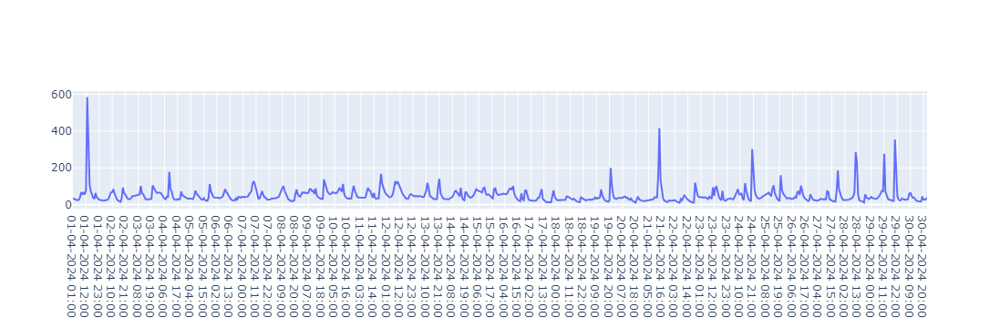

In [7]:
# Create subplots
fig = make_subplots(rows=1, cols=1)

# Add traces with names
fig.append_trace(go.Scatter(x=df['CreatedDate'], y=df['pm25_1201240085'], name='Pm2.5'), row=1, col=1)
fig.show()

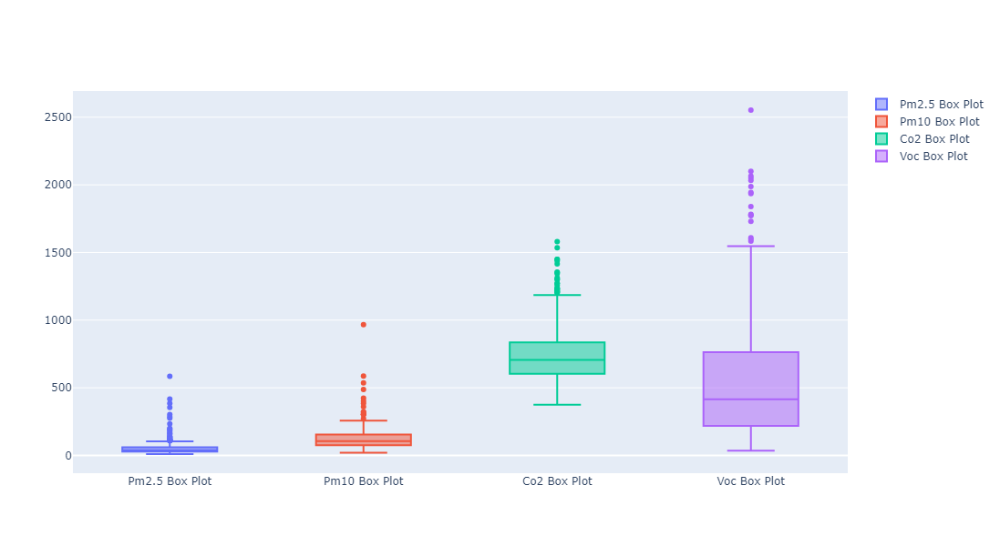

In [8]:
fig_box = go.Figure()

# Add Pm2.5 box plot
fig_box.add_trace(go.Box(y=df['pm25_1201240085'], name='Pm2.5 Box Plot'))
# Add Pm10 box plot as a subplot
fig_box.add_trace(go.Box(y=df['pm10_1201240085'], name='Pm10 Box Plot'))
#Add co2 box plot 
fig_box.add_trace(go.Box(y=df['co2_1201240085'], name='Co2 Box Plot'))
#Add voc box plot 
fig_box.add_trace(go.Box(y=df['voc_1201240085'], name='Voc Box Plot'))

# Update layout to adjust width and height
fig_box.update_layout(width=900, height=600)
fig_box.show()

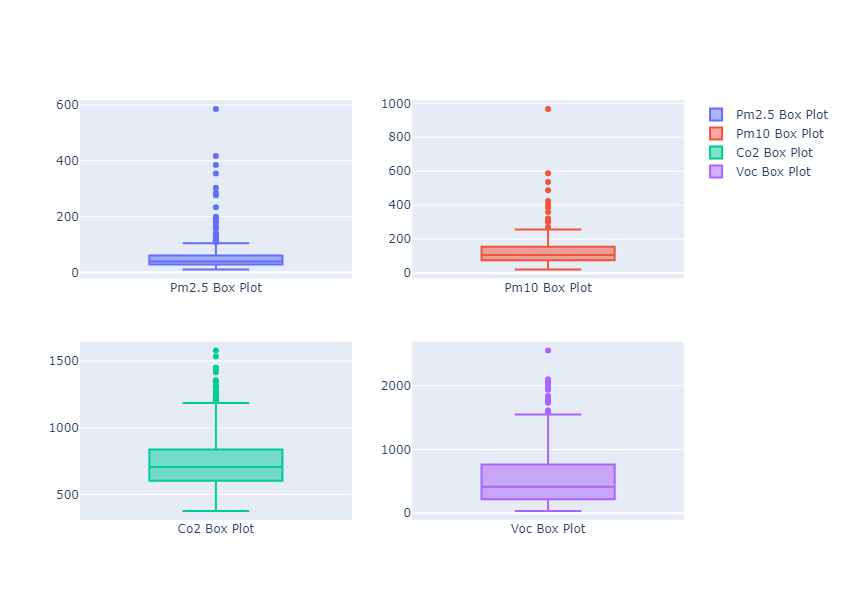

In [10]:
fig1_box = make_subplots(rows=2, cols=2)

# Add Pm2.5 box plot
fig1_box.add_trace(go.Box(y=df['pm25_1201240085'], name='Pm2.5 Box Plot'), row=1, col=1)
# Add Pm10 box plot
fig1_box.add_trace(go.Box(y=df['pm10_1201240085'], name='Pm10 Box Plot'), row=1, col=2)
# Add Co2 box plot
fig1_box.add_trace(go.Box(y=df['co2_1201240085'], name='Co2 Box Plot'), row=2, col=1)
# Add Voc box plot
fig1_box.add_trace(go.Box(y=df['voc_1201240085'], name='Voc Box Plot'), row=2, col=2)

# Update layout to adjust width and height
fig1_box.update_layout(width=900, height=600)
fig1_box.show()

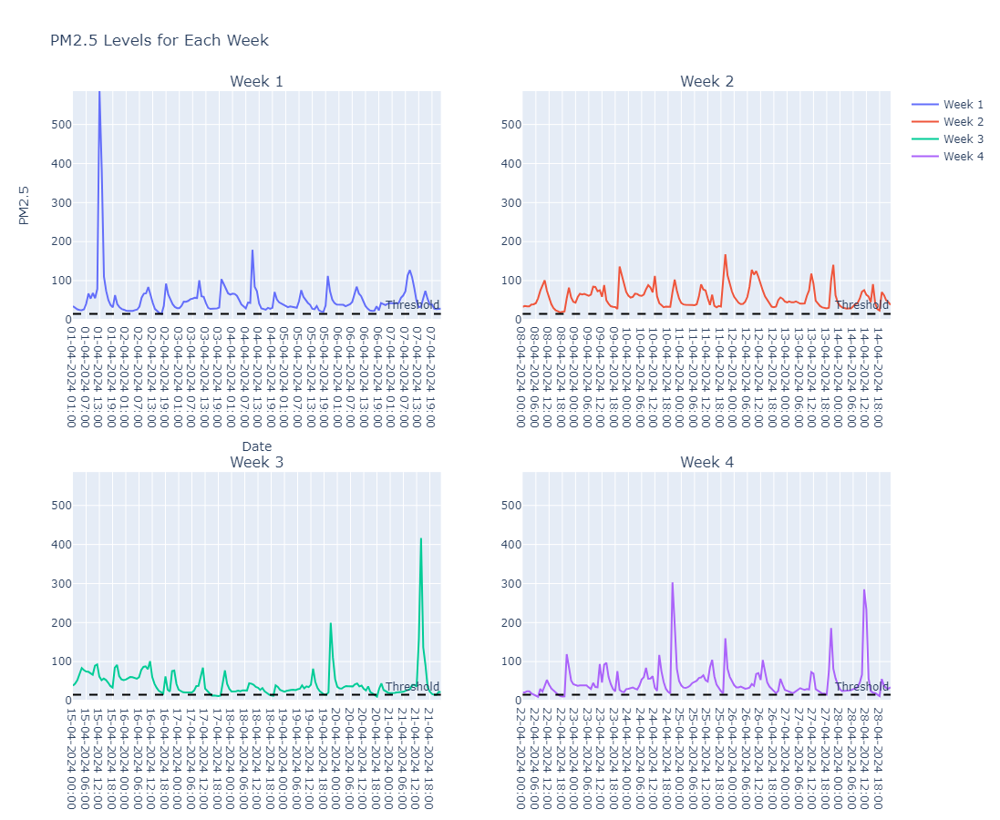

In [10]:
fig3 = make_subplots(rows=2, cols=2, subplot_titles=("Week 1", "Week 2", "Week 3", "Week 4")) # here rows and columns are like matrices here a table of 2x2 will be formed
max_pm25_value = df['pm25_1201240085'].max() # max value to y-axis same for all graphss

# Define date ranges for each week
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
# Plot each week's data in a separate subplot
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    # Filter data for the current week
    week_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1
    fig3.append_trace(go.Scatter(x=week_data['CreatedDate'], y=week_data['pm25_1201240085'], name=f'Week {i}'), row=row, col=col)
    fig3.add_hline(y=15, line_dash="dash", line_color="black", annotation_text="Threshold", row=row, col=col)
     # to make all y-axis of the same size;
    fig3.update_yaxes(range=[0, max_pm25_value], row=row, col=col)
    
fig3.update_layout(title='PM2.5 Levels for Each Week',
                  xaxis_title='Date',
                  yaxis_title='PM2.5',
                 height=900,  # specify height
                  width=1000)
fig3.show()

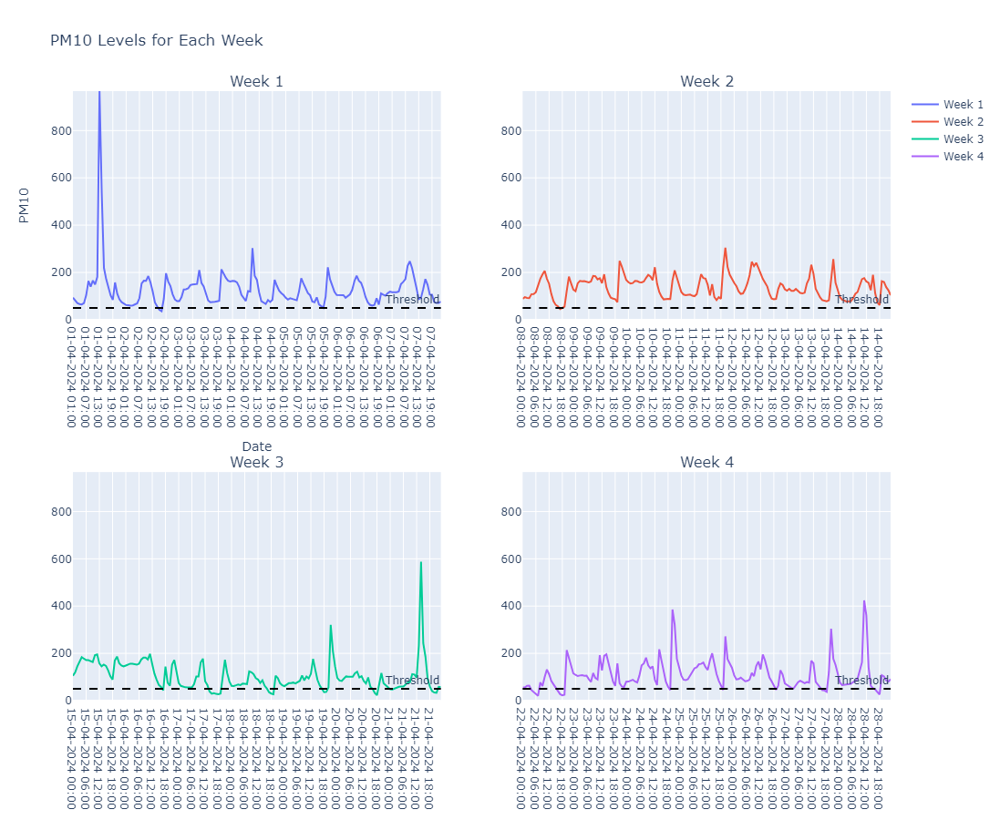

In [11]:
fig4 = make_subplots(rows=2, cols=2, subplot_titles=("Week 1", "Week 2", "Week 3", "Week 4"))
max_pm10_value = df['pm10_1201240085'].max()
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    # Filter data for the current week
    week_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1
    fig4.append_trace(go.Scatter(x=week_data['CreatedDate'], y=week_data['pm10_1201240085'], name=f'Week {i}'), row=row, col=col)
    fig4.add_hline(y=50, line_dash="dash", line_color="black", annotation_text="Threshold", row=row, col=col)
     # to make all y-axis of the same size;
    fig4.update_yaxes(range=[0, max_pm10_value], row=row, col=col)
fig4.update_layout(title='PM10 Levels for Each Week',
                  xaxis_title='Date',
                  yaxis_title='PM10',
                 height=900,  # specify height
                  width=1000)
fig4.show()

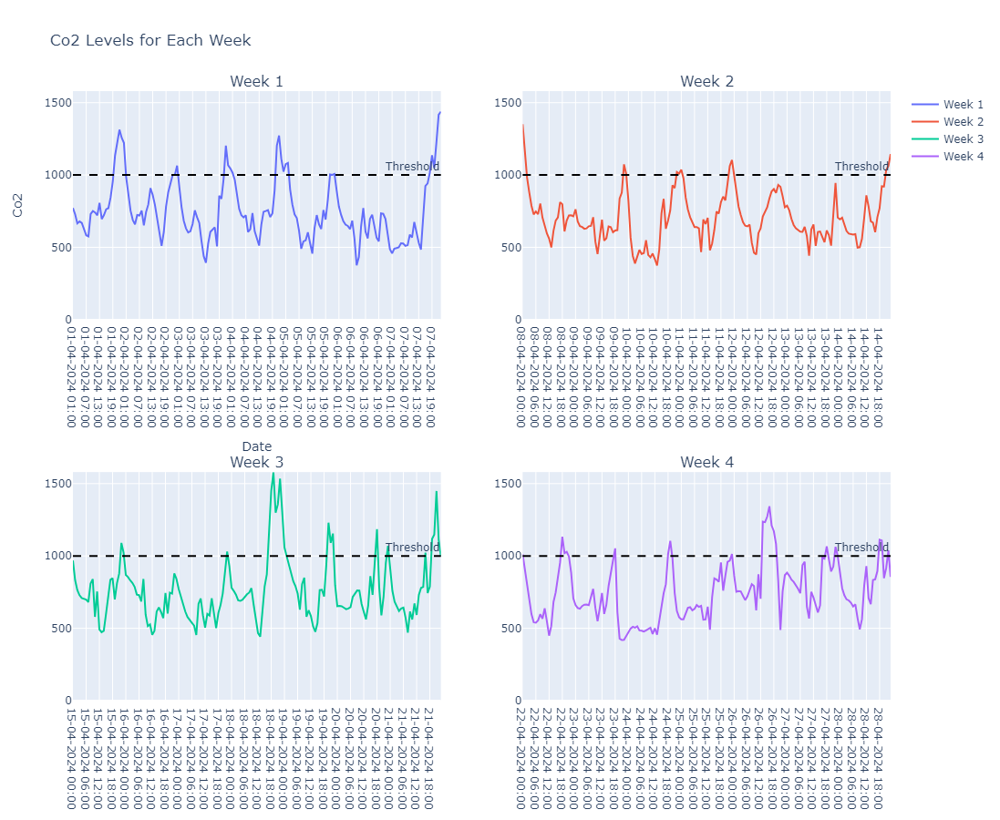

In [12]:
# Create subplots
fig5 = make_subplots(rows=2, cols=2, subplot_titles=("Week 1", "Week 2", "Week 3", "Week 4"))
max_co2_value = df['co2_1201240085'].max()

# Define date ranges for each week
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
# Plot each week's data in a separate subplot
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    # Filter data for the current week
    week_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1
    fig5.append_trace(go.Scatter(x=week_data['CreatedDate'], y=week_data['co2_1201240085'], name=f'Week {i}'), row=row, col=col)
    fig5.add_hline(y=1000, line_dash="dash", line_color="black", annotation_text="Threshold", row=row, col=col)
     # to make all y-axis of the same size;
    fig5.update_yaxes(range=[0, max_co2_value], row=row, col=col)
fig5.update_layout(title='Co2 Levels for Each Week',
                  xaxis_title='Date',
                  yaxis_title='Co2',
                 height=900,  # specify height
                  width=1000)
fig5.show()

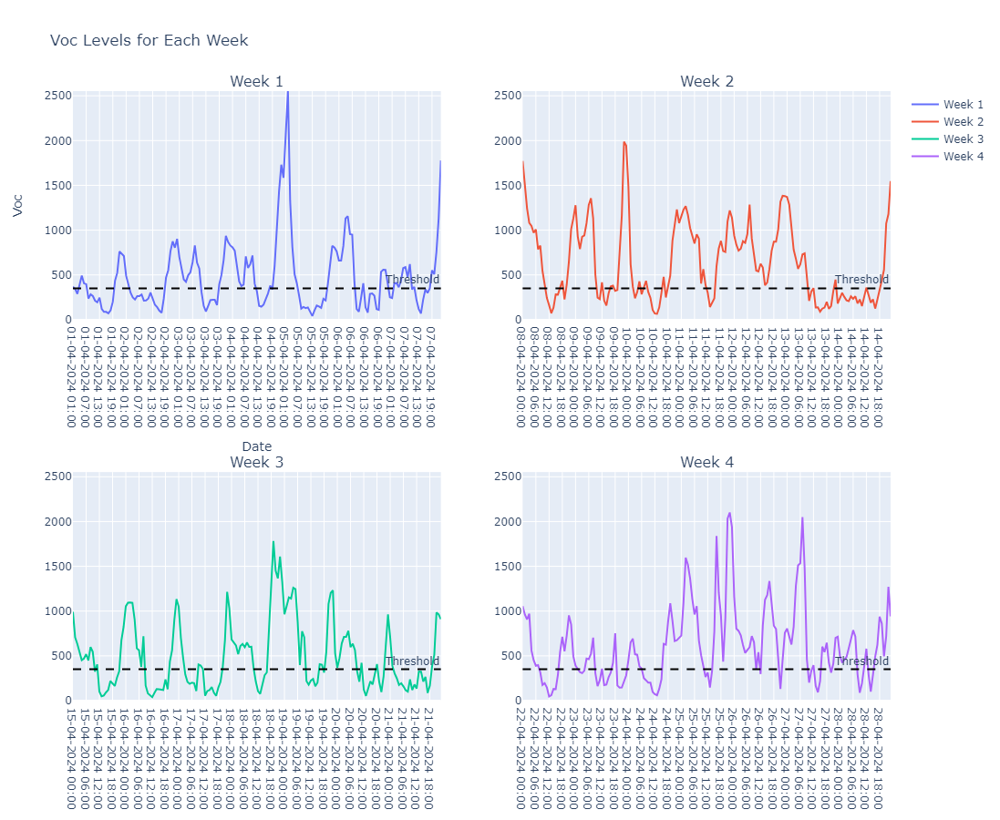

In [13]:
fig6 = make_subplots(rows=2, cols=2, subplot_titles=("Week 1", "Week 2", "Week 3", "Week 4"))
max_voc_value = df['voc_1201240085'].max()

# Define date ranges for each week
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
# Plot each week's data in a separate subplot
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    # Filter data for the current week
    week_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1
    fig6.append_trace(go.Scatter(x=week_data['CreatedDate'], y=week_data['voc_1201240085'], name=f'Week {i}'), row=row, col=col)
    fig6.add_hline(y=350, line_dash="dash", line_color="black", annotation_text="Threshold", row=row, col=col)
     # to make all y-axis of the same size;
    fig6.update_yaxes(range=[0, max_voc_value], row=row, col=col)
fig6.update_layout(title='Voc Levels for Each Week',
                  xaxis_title='Date',
                  yaxis_title='Voc',
                 height=900,  
                  width=1100)
fig6.show()

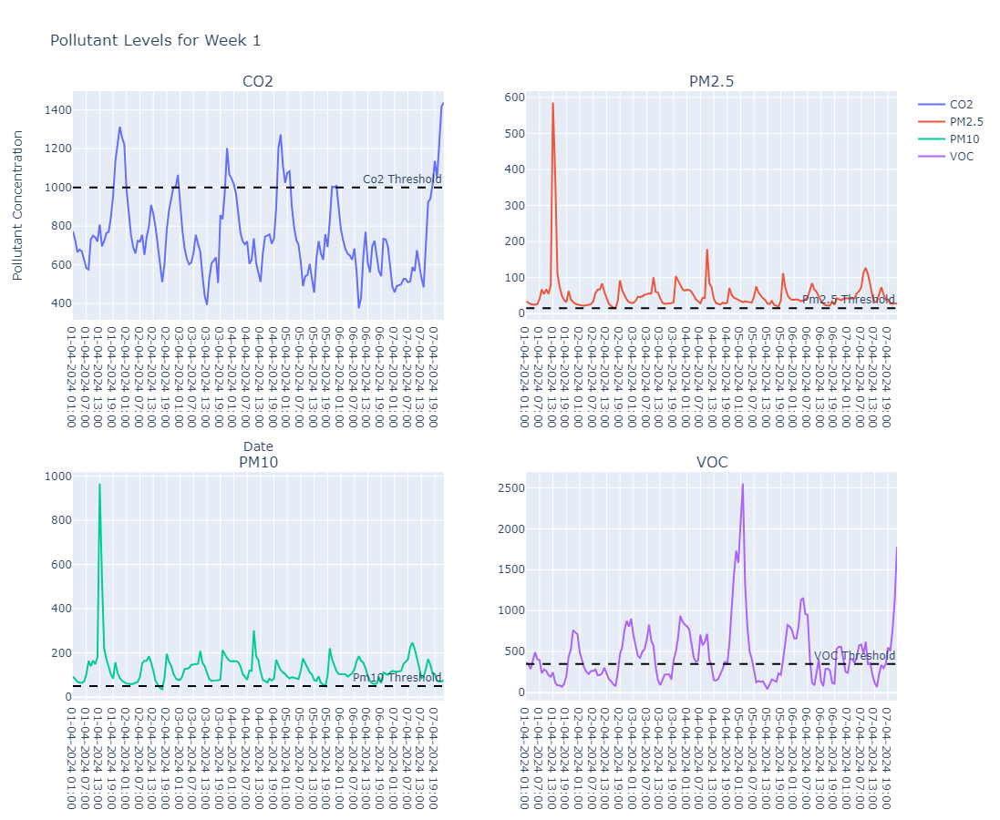

In [14]:
fig7 = make_subplots(rows=2, cols=2, subplot_titles=("CO2", "PM2.5", "PM10", "VOC"))
start_date = '01-04-2024'
end_date = '07/04/2024'

# Filter data for Week 1
week1_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]

# Plot each pollutant for Week 1 in a separate subplot
pollutants = ['co2_1201240085', 'pm25_1201240085', 'pm10_1201240085', 'voc_1201240085']
titles = ["CO2", "PM2.5", "PM10", "VOC"]

for i, (pollutant, title) in enumerate(zip(pollutants, titles), start=1):
    fig7.add_trace(go.Scatter(x=week1_data['CreatedDate'], y=week1_data[pollutant], name=title), row=(i - 1) // 2 + 1, col=(i - 1) % 2 + 1)

# Add threshold line for VOC
fig7.add_hline(y=350, line_dash="dash", line_color="black", annotation_text="VOC Threshold", row=2, col=2)
fig7.add_hline(y=1000, line_dash="dash", line_color="black", annotation_text="Co2 Threshold", row=1, col=1)
fig7.add_hline(y=50, line_dash="dash", line_color="black", annotation_text="Pm10 Threshold", row=2, col=1)
fig7.add_hline(y=15, line_dash="dash", line_color="black", annotation_text="Pm2.5 Threshold", row=1, col=2)
fig7.update_layout(title='Pollutant Levels for Week 1',
                  xaxis_title='Date',
                  yaxis_title='Pollutant Concentration',
                  height=900,
                  width=1000)
fig7.show()

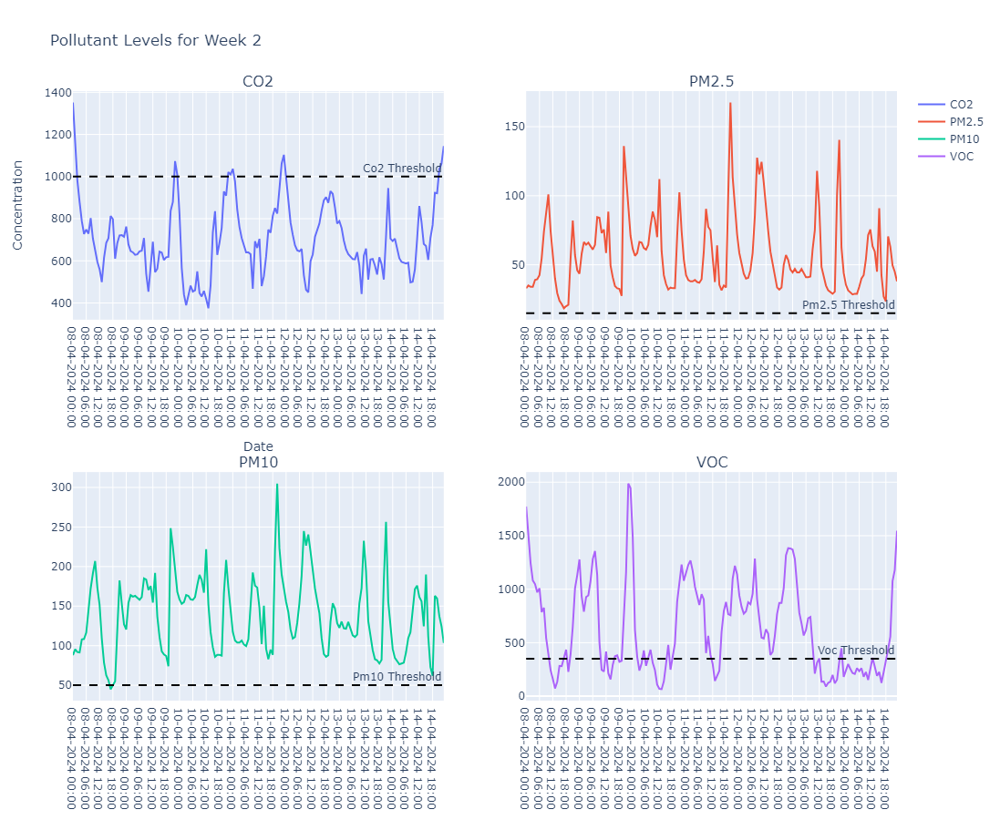

In [15]:
fig8 = make_subplots(rows=2, cols=2, subplot_titles=("CO2", "PM2.5", "PM10", "VOC"))
start_date = '08-04-2024'
end_date = '14/04/2024'

# Filter data for Week 1
week2_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]

# Plot each pollutant for Week 1 in a separate subplot
pollutants = ['co2_1201240085', 'pm25_1201240085', 'pm10_1201240085', 'voc_1201240085']
titles = ["CO2", "PM2.5", "PM10", "VOC"]

for i, (pollutant, title) in enumerate(zip(pollutants, titles), start=1):
    fig8.add_trace(go.Scatter(x=week2_data['CreatedDate'], y=week2_data[pollutant], name=title), row=(i - 1) // 2 + 1, col=(i - 1) % 2 + 1)
# Add threshold line for VOC
fig8.add_hline(y=350, line_dash="dash", line_color="black", annotation_text="Voc Threshold", row=2, col=2)
fig8.add_hline(y=50, line_dash="dash", line_color="black", annotation_text="Pm10 Threshold", row=2, col=1)
fig8.add_hline(y=15, line_dash="dash", line_color="black", annotation_text="Pm2.5 Threshold", row=1, col=2)
fig8.add_hline(y=1000, line_dash="dash", line_color="black", annotation_text="Co2 Threshold", row=1, col=1)

fig8.update_layout(title='Pollutant Levels for Week 2',
                  xaxis_title='Date',
                  yaxis_title='Concentration',
                  height=900,
                  width=1000)

fig8.show()

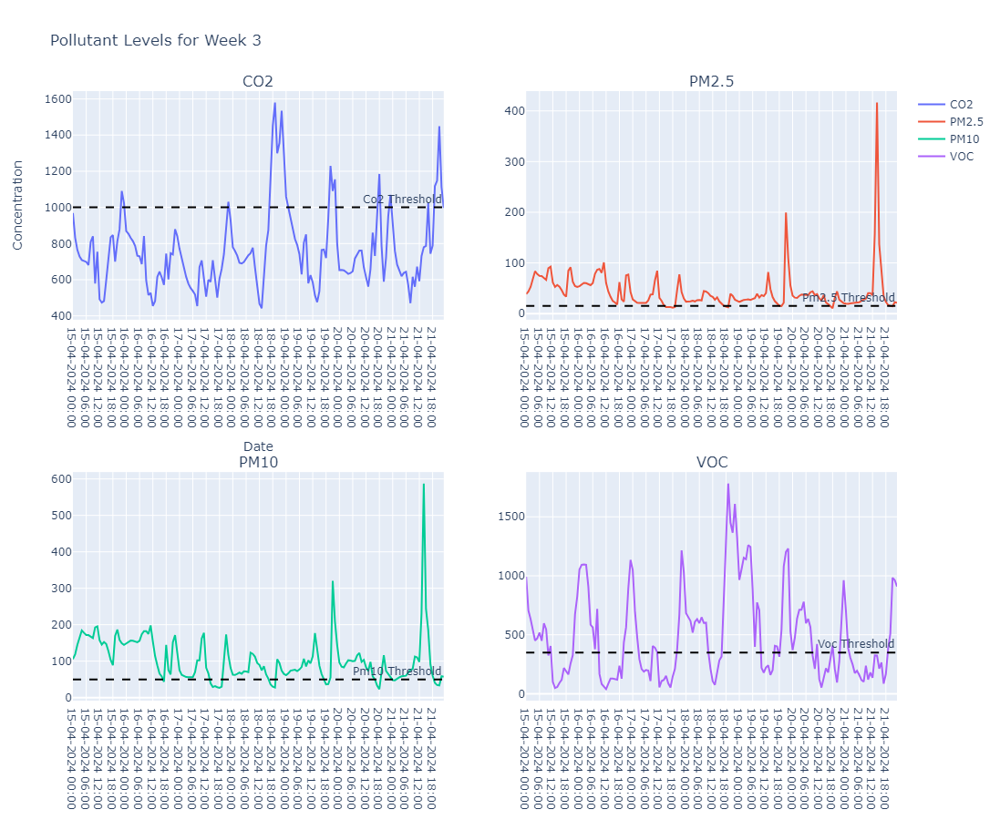

In [16]:
fig9 = make_subplots(rows=2, cols=2, subplot_titles=("CO2", "PM2.5", "PM10", "VOC"))
start_date = '15-04-2024'
end_date = '21/04/2024'

# Filter data for Week 1
week3_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]

# Plot each pollutant for Week 1 in a separate subplot
pollutants = ['co2_1201240085', 'pm25_1201240085', 'pm10_1201240085', 'voc_1201240085']
titles = ["CO2", "PM2.5", "PM10", "VOC"]

for i, (pollutant, title) in enumerate(zip(pollutants, titles), start=1):
    fig9.add_trace(go.Scatter(x=week3_data['CreatedDate'], y=week3_data[pollutant], name=title), row=(i - 1) // 2 + 1, col=(i - 1) % 2 + 1)
# Add threshold line for VOC
fig9.add_hline(y=350, line_dash="dash", line_color="black", annotation_text="Voc Threshold", row=2, col=2)
fig9.add_hline(y=50, line_dash="dash", line_color="black", annotation_text="Pm10 Threshold", row=2, col=1)
fig9.add_hline(y=15, line_dash="dash", line_color="black", annotation_text="Pm2.5 Threshold", row=1, col=2)
fig9.add_hline(y=1000, line_dash="dash", line_color="black", annotation_text="Co2 Threshold", row=1, col=1)

fig9.update_layout(title='Pollutant Levels for Week 3',
                  xaxis_title='Date',
                  yaxis_title='Concentration',
                  height=900,
                  width=1000)
fig9.show()

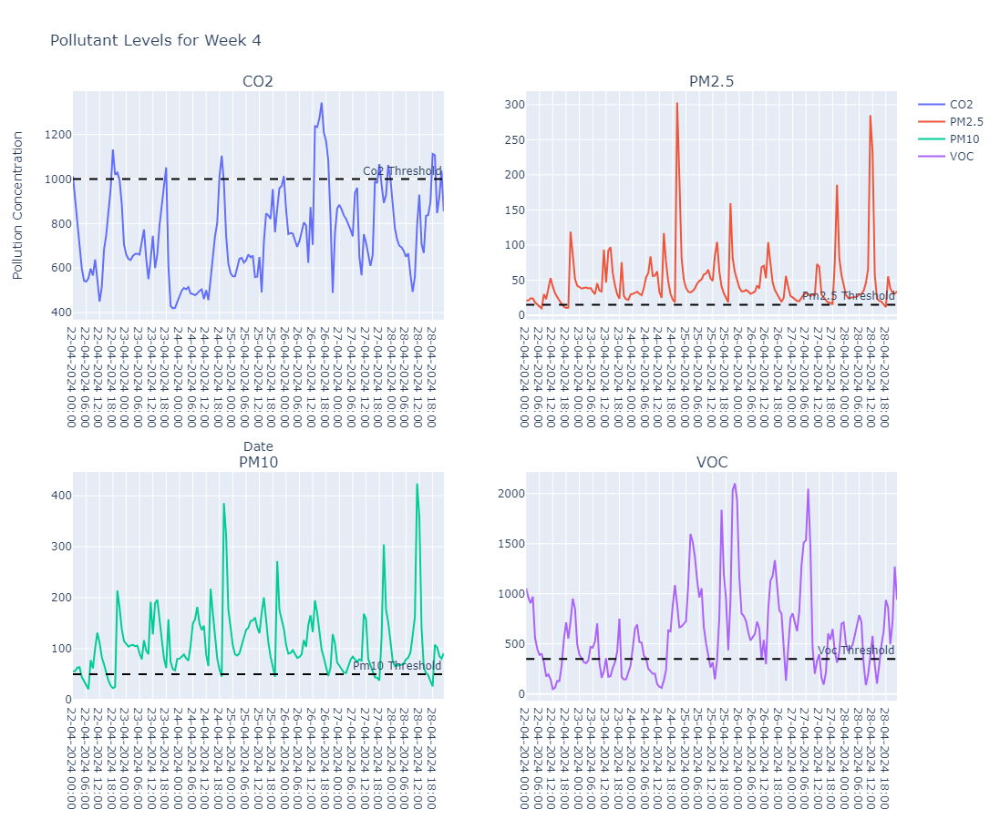

In [17]:
fig10 = make_subplots(rows=2, cols=2, subplot_titles=("CO2", "PM2.5", "PM10", "VOC"))
start_date = '22-04-2024'
end_date = '28/04/2024'

# Filter data for Week 1
week4_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
# Plot each pollutant for Week 1 in a separate subplot
pollutants = ['co2_1201240085', 'pm25_1201240085', 'pm10_1201240085', 'voc_1201240085']
titles = ["CO2", "PM2.5", "PM10", "VOC"]

for i, (pollutant, title) in enumerate(zip(pollutants, titles), start=1):
    fig10.add_trace(go.Scatter(x=week4_data['CreatedDate'], y=week4_data[pollutant], name=title), row=(i - 1) // 2 + 1, col=(i - 1) % 2 + 1)

# threshold line for VOC
fig10.add_hline(y=350, line_dash="dash", line_color="black", annotation_text="Voc Threshold", row=2, col=2)
fig10.add_hline(y=50, line_dash="dash", line_color="black", annotation_text="Pm10 Threshold", row=2, col=1)
fig10.add_hline(y=15, line_dash="dash", line_color="black", annotation_text="Pm2.5 Threshold", row=1, col=2)
fig10.add_hline(y=1000, line_dash="dash", line_color="black", annotation_text="Co2 Threshold", row=1, col=1)

fig10.update_layout(title='Pollutant Levels for Week 4',
                  xaxis_title='Date',
                  yaxis_title='Pollution Concentration',
                  height=900,
                  width=1000)
fig10.show()

### Outdoor 

In [18]:
of=pd.read_csv('Dataset/Patparganj Outdoor 1 month.csv')

In [19]:
of.shape

(721, 3)

In [20]:
of.head()

,CreatedDate,Pm2.5,Pm10
0,01-04-2024 01:00,35.50,109.50
1,01-04-2024 02:00,37.25,96.50
2,01-04-2024 03:00,28.50,87.00
3,01-04-2024 04:00,28.50,86.25
4,01-04-2024 05:00,35.25,104.25


In [21]:
of.tail()

,CreatedDate,Pm2.5,Pm10
716,30-04-2024 21:00,47.75,297.75
717,30-04-2024 22:00,60.25,356.75
718,30-04-2024 23:00,76.00,352.75
719,NaN,NaN,NaN
720,NaN,NaN,NaN


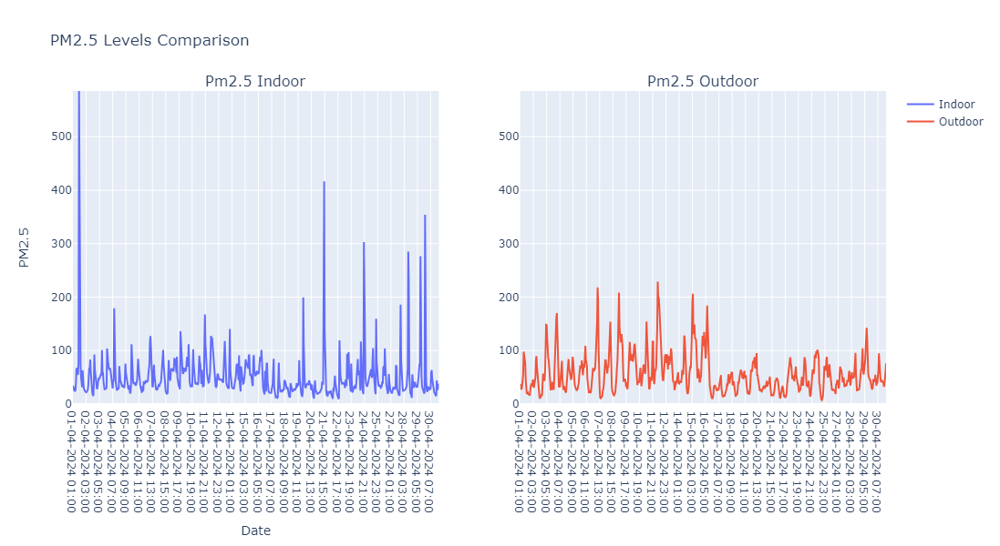

In [22]:
fig11 = make_subplots(rows=1, cols=2, subplot_titles=("Pm2.5 Indoor", "Pm2.5 Outdoor"))
max_y_value = max(df['pm25_1201240085'].max(), of['Pm2.5'].max())

fig11.add_trace(go.Scatter(x=df['CreatedDate'], y=df['pm25_1201240085'], name='Indoor'), row=1, col=1)
fig11.add_trace(go.Scatter(x=of['CreatedDate'], y=of['Pm2.5'], name='Outdoor'), row=1, col=2)

fig11.update_yaxes(range=[0, max_y_value])
fig11.update_layout(title='PM2.5 Levels Comparison',
                  xaxis_title='Date',
                  yaxis_title='PM2.5',
                  height=600,
                  width=1000)
fig11.show()

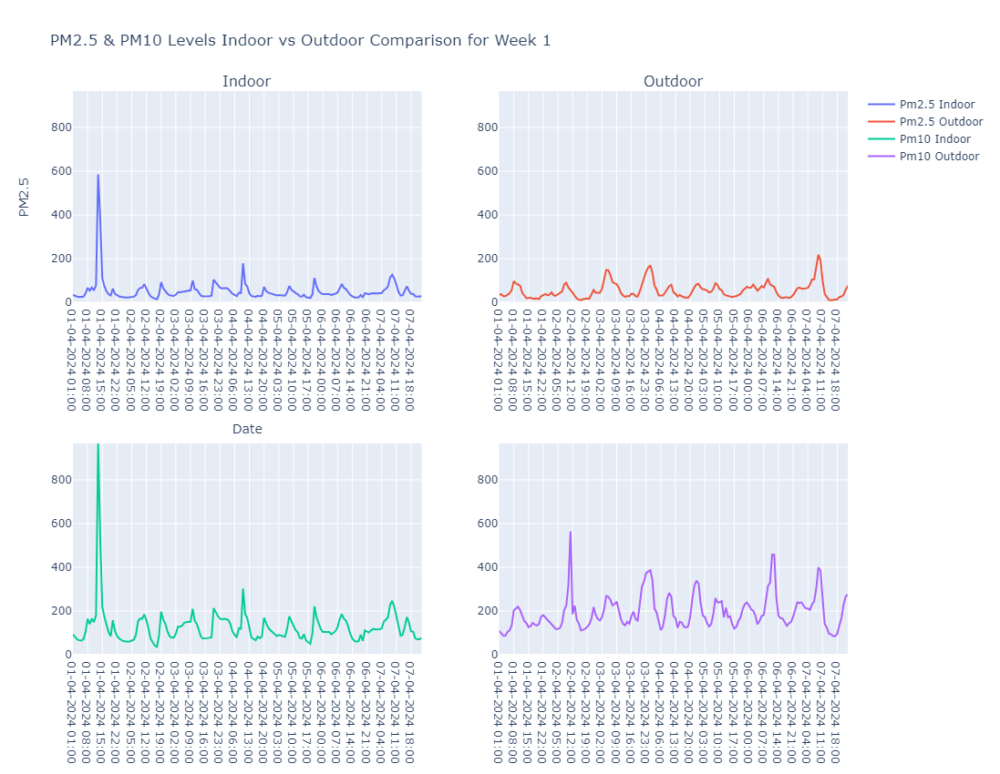

In [23]:
start_date = '01-04-2024'
end_date = '07/04/2024'
max_y1_value = max(df['pm25_1201240085'].max(), of['Pm2.5'].max(), df['pm10_1201240085'].max(), of['Pm10'].max())

# filter the data for indoor
df_week1 = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
# filter the date for outdoor
of_week1 = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]

fig12 = make_subplots(rows=2, cols=2, subplot_titles=("Indoor", "Outdoor")) # define rows and columns acording to the panel requirement

#PM2.5 indoor
fig12.add_trace(go.Scatter(x=df_week1['CreatedDate'], y=df_week1['pm25_1201240085'], name='Pm2.5 Indoor'), row=1, col=1)
# PM2.5 outdoor
fig12.add_trace(go.Scatter(x=of_week1['CreatedDate'], y=of_week1['Pm2.5'], name='Pm2.5 Outdoor'), row=1, col=2)
fig12.add_trace(go.Scatter(x=df_week1['CreatedDate'], y=df_week1['pm10_1201240085'], name='Pm10 Indoor'), row=2, col=1)
fig12.add_trace(go.Scatter(x=of_week1['CreatedDate'], y=of_week1['Pm10'], name='Pm10 Outdoor'), row=2, col=2)
fig12.update_yaxes(range=[0, max_y1_value])
fig12.update_layout(title='PM2.5 & PM10 Levels Indoor vs Outdoor Comparison for Week 1',
                     xaxis_title='Date',
                     yaxis_title='PM2.5',
                     height=850,
                     width=1000)
fig12.show()

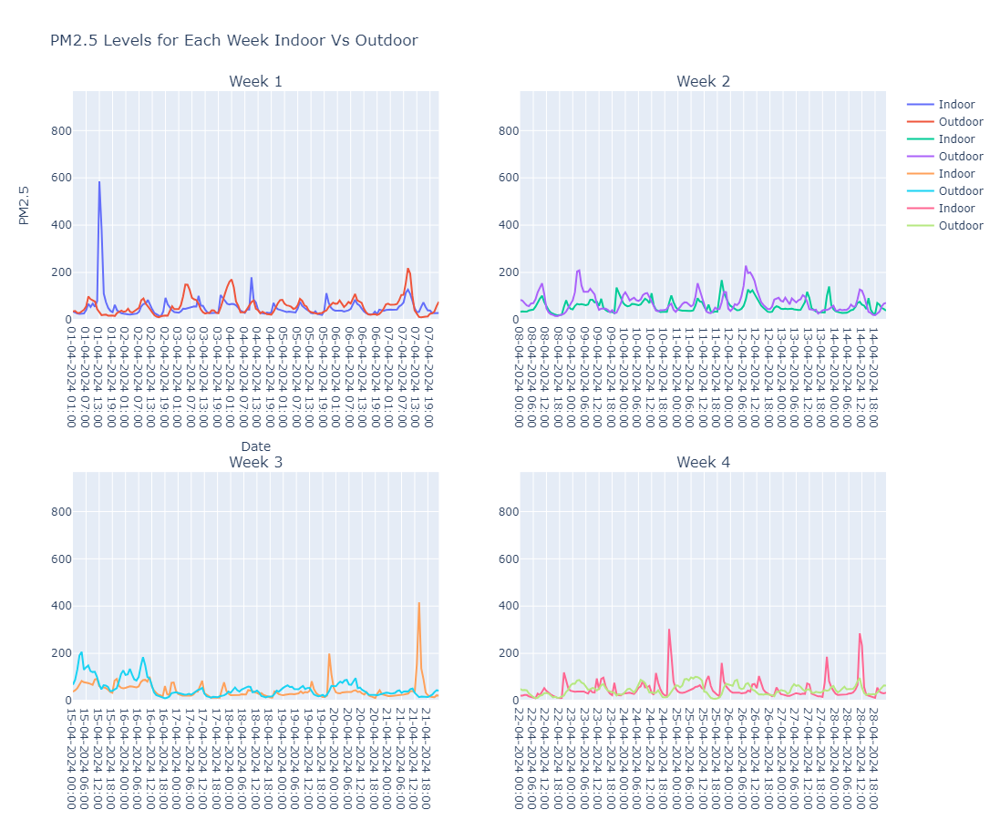

In [24]:
fig13 = make_subplots(rows=2, cols=2, subplot_titles=("Week 1", "Week 2", "Week 3", "Week 4"))
max_y2_value = max(df['pm25_1201240085'].max(), of['Pm2.5'].max(), df['pm10_1201240085'].max(), of['Pm10'].max())
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    indoor_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    outdoor_data = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1
    #PM2.5 from indoor
    fig13.add_trace(go.Scatter(x=indoor_data['CreatedDate'], y=indoor_data['pm25_1201240085'], name='Indoor'), row=row, col=col)
    #PM2.5 from outdoor
    fig13.add_trace(go.Scatter(x=outdoor_data['CreatedDate'], y=outdoor_data['Pm2.5'], name='Outdoor'), row=row, col=col)
fig13.update_layout(title='PM2.5 Levels for Each Week Indoor Vs Outdoor',
                  xaxis_title='Date',
                  yaxis_title='PM2.5',
                 height=900, 
                  width=1000)
fig13.update_yaxes(range=[0, max_y2_value])
fig13.show()

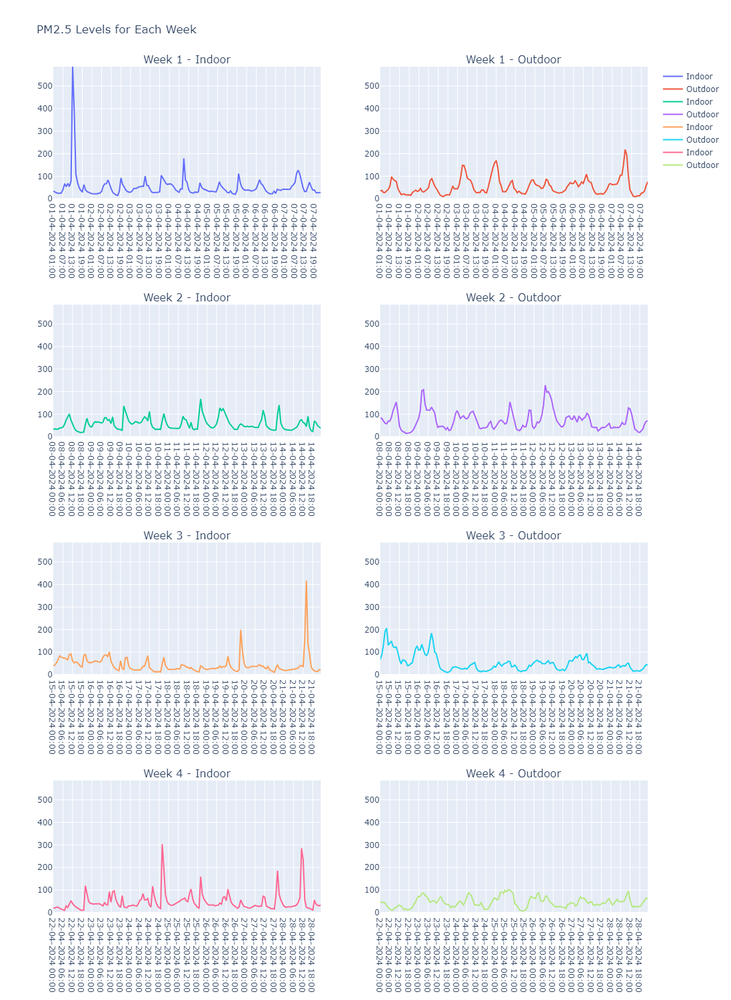

In [25]:
fig14 = make_subplots(rows=4, cols=2, subplot_titles=("Week 1 - Indoor", "Week 1 - Outdoor",
                                                    "Week 2 - Indoor", "Week 2 - Outdoor",
                                                    "Week 3 - Indoor", "Week 3 - Outdoor",
                                                    "Week 4 - Indoor", "Week 4 - Outdoor"))
max_y3_value = max(df['pm25_1201240085'].max(), of['Pm2.5'].max())
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    indoor_data = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    outdoor_data = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]
    # indoor data
    fig14.add_trace(go.Scatter(x=indoor_data['CreatedDate'], y=indoor_data['pm25_1201240085'], name='Indoor'),
                  row=i, col=1)
    # outdoor data
    fig14.add_trace(go.Scatter(x=outdoor_data['CreatedDate'], y=outdoor_data['Pm2.5'], name='Outdoor'),
                  row=i, col=2)
fig14.update_layout(title='PM2.5 Levels for Each Week',
                  height=1500, 
                  width=1000)
fig14.update_yaxes(range=[0, max_y3_value])
fig14.show()

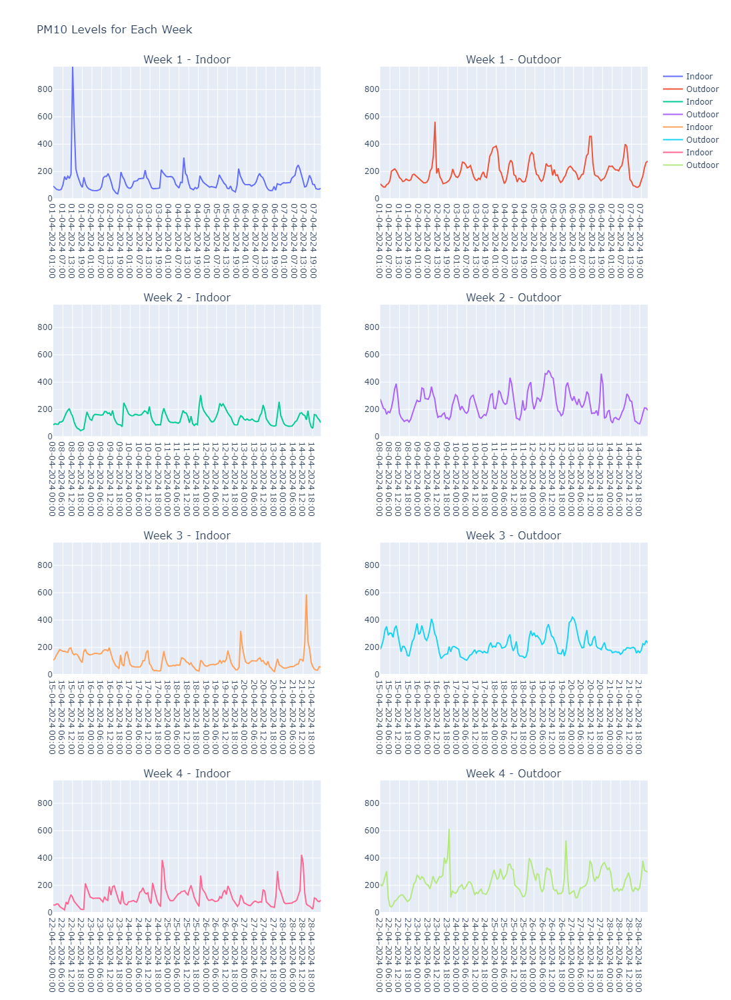

In [26]:
fig15 = make_subplots(rows=4, cols=2, subplot_titles=("Week 1 - Indoor", "Week 1 - Outdoor",
                                                    "Week 2 - Indoor", "Week 2 - Outdoor",
                                                    "Week 3 - Indoor", "Week 3 - Outdoor",
                                                    "Week 4 - Indoor", "Week 4 - Outdoor"))
max_y4_value = max(df['pm10_1201240085'].max(), of['Pm10'].max())
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
for i, (start_date, end_date) in enumerate(date_ranges, start=1):

    indoor_data1 = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    outdoor_data1 = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]
    # indoor data
    fig15.add_trace(go.Scatter(x=indoor_data1['CreatedDate'], y=indoor_data1['pm10_1201240085'], name='Indoor'),
                  row=i, col=1)
    # outdoor data
    fig15.add_trace(go.Scatter(x=outdoor_data1['CreatedDate'], y=outdoor_data1['Pm10'], name='Outdoor'),
                  row=i, col=2)

fig15.update_layout(title='PM10 Levels for Each Week',
                  height=1500, 
                  width=1000)
fig15.update_yaxes(range=[0, max_y4_value])
fig15.show()

In [40]:
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
correlation_weekly_Pm10 = []
for i, (start_date, end_date) in enumerate(date_ranges, start=1):
    
    indoor_data2 = df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    outdoor_data2 = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]
     # Calculate correlation for the current week
    correlation_Pm10 = indoor_data2['pm10_1201240085'].corr(outdoor_data2['Pm10'])
    correlation_weekly_Pm10.append(correlation_Pm10)

for i, correlation_Pm10 in enumerate(correlation_weekly_Pm10, start=1):
    print(f"Correlation dor PM10 between indoor & outdoor for Week {i}: {correlation_Pm10}")

Correlation dor PM10 between indoor & outdoor for Week 1: 0.23112275540649438
Correlation dor PM10 between indoor & outdoor for Week 2: 0.5142848899650396
Correlation dor PM10 between indoor & outdoor for Week 3: 0.3720385836426152
Correlation dor PM10 between indoor & outdoor for Week 4: 0.2964435758066362


In [41]:
date_ranges = [
    ('01-04-2024', '07/04/2024'),
    ('08-04-2024', '14/04/2024'),
    ('15-04-2024', '21/04/2024'),
    ('22-04-2024', '28/04/2024')
]
correlation_weekly_Pm25 = []

for i, (start_date, end_date) in enumerate(date_ranges, start=1):
  
    indoor_data3= df[(df['CreatedDate'] >= start_date) & (df['CreatedDate'] <= end_date)]
    outdoor_data3 = of[(of['CreatedDate'] >= start_date) & (of['CreatedDate'] <= end_date)]
     # Calculate correlation for the current week
    correlation_Pm25 = indoor_data3['pm25_1201240085'].corr(outdoor_data3['Pm2.5'])
    correlation_weekly_Pm25.append(correlation_Pm25)
    
for i, correlation_Pm25 in enumerate(correlation_weekly_Pm25, start=1):
    print(f"Correlation for PM2.5 indoor & outdoor  for Week {i}: {correlation_Pm25}")

Correlation for PM2.5 indoor & outdoor  for Week 1: 0.14710083688275227
Correlation for PM2.5 indoor & outdoor  for Week 2: 0.49445395726946023
Correlation for PM2.5 indoor & outdoor  for Week 3: 0.25466571248561876
Correlation for PM2.5 indoor & outdoor  for Week 4: 0.14890570000421405
